In [1]:
from pandas import DataFrame, read_csv, get_dummies
from scipy.stats import zscore
from statsmodels.stats.outliers_influence import variance_inflation_factor
from matplotlib.pyplot import figure, subplot2grid
from seaborn import set_theme,scatterplot,displot,barplot,countplot,heatmap
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error
from numpy import where,abs,median,nan,sqrt
%matplotlib inline

In [2]:
set_theme(context="notebook",style='darkgrid', palette='inferno')

In [3]:
df = read_csv("Engineering_graduate_salary.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2998 entries, 0 to 2997
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     2998 non-null   int64  
 1   Gender                 2998 non-null   object 
 2   DOB                    2998 non-null   object 
 3   10percentage           2998 non-null   float64
 4   10board                2998 non-null   object 
 5   12graduation           2998 non-null   int64  
 6   12percentage           2998 non-null   float64
 7   12board                2998 non-null   object 
 8   CollegeID              2998 non-null   int64  
 9   CollegeTier            2998 non-null   int64  
 10  Degree                 2998 non-null   object 
 11  Specialization         2998 non-null   object 
 12  collegeGPA             2998 non-null   float64
 13  CollegeCityID          2998 non-null   int64  
 14  CollegeCityTier        2998 non-null   int64  
 15  Coll

In [5]:
df.head()

,ID,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Salary
0,604399,f,1990-10-22,87.80,cbse,2009,84.00,cbse,6920,1,...,-1,-1,-1,-1,-0.1590,0.3789,1.2396,0.14590,0.2889,445000
1,988334,m,1990-05-15,57.00,cbse,2010,64.50,cbse,6624,2,...,-1,-1,-1,-1,1.1336,0.0459,1.2396,0.52620,-0.2859,110000
2,301647,m,1989-08-21,77.33,"maharashtra state board,pune",2007,85.17,amravati divisional board,9084,2,...,-1,-1,260,-1,0.5100,-0.1232,1.5428,-0.29020,-0.2875,255000
3,582313,m,1991-05-04,84.30,cbse,2009,86.00,cbse,8195,1,...,-1,-1,-1,-1,-0.4463,0.2124,0.3174,0.27270,0.4805,420000
4,339001,f,1990-10-30,82.00,cbse,2008,75.00,cbse,4889,2,...,-1,-1,-1,-1,-1.4992,-0.7473,-1.0697,0.06223,0.1864,200000


-1 in the data represents that student has not attempted that section

For sake of convenience I will replace -1 with 0

So if a student has not attempted the section it will add nothing to the Salary

In [6]:
df.replace(to_replace=-1, value=0,inplace=True)

Now let's plot correlation matrix

Text(0.5, 1.0, 'Correlation Matrix')

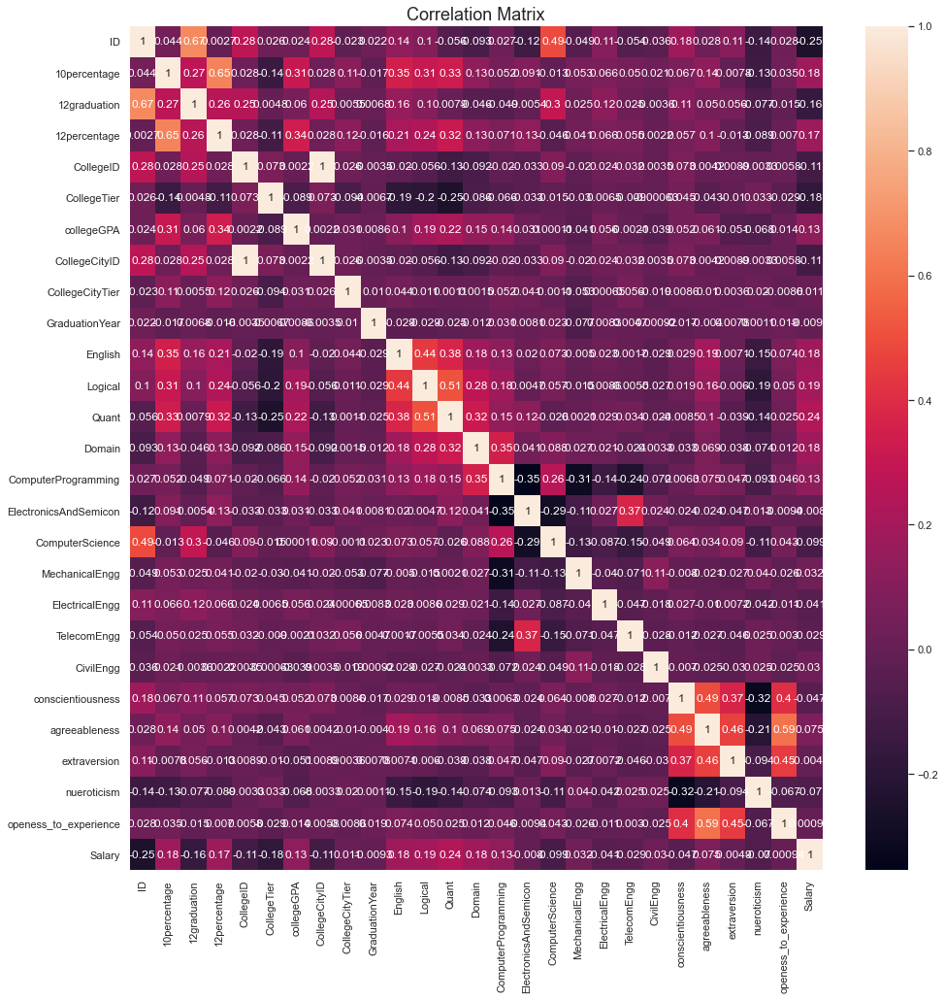

In [7]:
figure(figsize=(16,16))
plot = heatmap(df.corr(), annot=True)
plot.set_title("Correlation Matrix", fontsize=18)

I will drop ID and DOB columns as they are not very relevant to the Salary

In [8]:
df.drop(columns=["ID", "DOB"], inplace=True)

I will map Gender to integers so that it can be used in the calculations

In [9]:
df["Gender"] = df["Gender"].replace({'m': 0, 'f': 1})

I will calculate [variance inflation factor](https://en.wikipedia.org/wiki/Variance_inflation_factor) which will help us identity if the there is [multicollinearity](https://en.wikipedia.org/wiki/Multicollinearity) in the data

In [10]:
X = df[['Gender', '10percentage', '12graduation', '12percentage', 'CollegeID', 'CollegeTier', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience', 'Salary']]

vif_data = DataFrame()
vif_data["Column"] = X.columns

vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

vif_data

C:\Users\satvik virmani\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\stats\outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,Column,VIF
0,Gender,1.468307
1,10percentage,121.296663
2,12graduation,3291.124998
3,12percentage,85.023074
4,CollegeID,inf
5,CollegeTier,60.537401
6,collegeGPA,95.907709
7,CollegeCityID,inf
8,CollegeCityTier,1.479093
9,GraduationYear,3023.353859


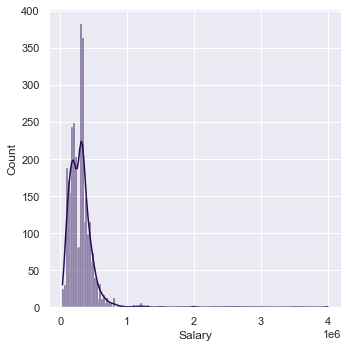

In [11]:
plot = displot(df["Salary"], kde=True)

Our data looked very skewed, this can be because of Outliers (outliers are the points in the dataset which show high deviation from most of the data)

To make it a more normalised distribution we can remove Outliers

We can remove outliers using various algorithms and technique

Here I am going to use Z-Score (Z-Score is the how much times the standard deviation a point is deviated from the mean value.)

We will replace the values that are very largely deviated with the median value.

In [12]:
df["Salary"] = df["Salary"].replace([df["Salary"][(abs(zscore(df["Salary"])) > 3)]], median(df["Salary"]))

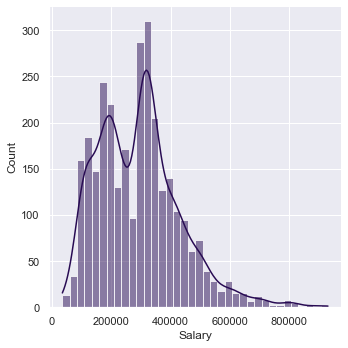

In [13]:
plot = displot(data=df["Salary"], kde=True)

This looks more like a normal distribution.

Text(0.5, 1.0, 'Scatter Plot of Gender with Salary')

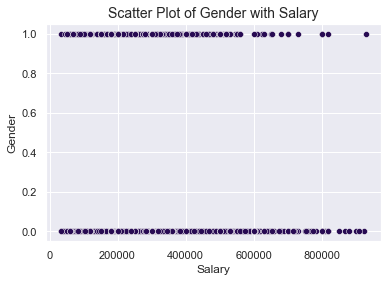

In [14]:
plot = scatterplot(x=df.Salary, y=df.Gender)
plot.set_title("Scatter Plot of Gender with Salary", fontsize=14)

Text(0.5, 1.0, 'Scatter Plot of 10percentage with 12percentage')

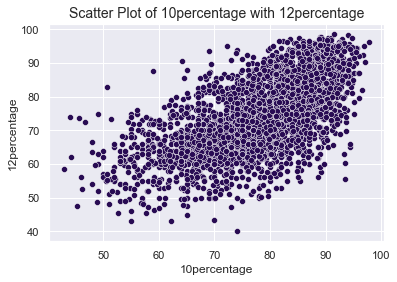

In [15]:
plot = scatterplot(x=df['10percentage'], y=df['12percentage'])
plot.set_title("Scatter Plot of 10percentage with 12percentage", fontsize=14)

In [16]:
df["10percentage"].corr(df["12percentage"])

0.6455783772755833

There is high correlation between 10 & 12 percentages

Also there is high multicollinearity as seen in the VIF values

So instead of using both, I will use only 12 percentage as 12 percentage is somewhat more important as compared to 10 percentage.

In [17]:
df.drop(columns=["10percentage"], inplace=True)

Text(0.5, 1.0, 'Scatter Plot of CollegeID with CollegeCityID')

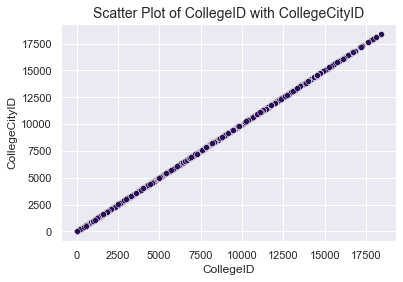

In [18]:
plot = scatterplot(x=df['CollegeID'], y=df['CollegeCityID'])
plot.set_title("Scatter Plot of CollegeID with CollegeCityID", fontsize=14)

Looks like CollegeID and CollegeCityID is same for every value

Also it had infinite VIF 

So it is neccessary to drop one of them

In [19]:
df.drop(columns=["CollegeID"], inplace=True)
df["CollegeCityID"].nunique()

1173

Text(0.5, 1.0, 'Scatter Plot of 12graduation with GraduationYear')

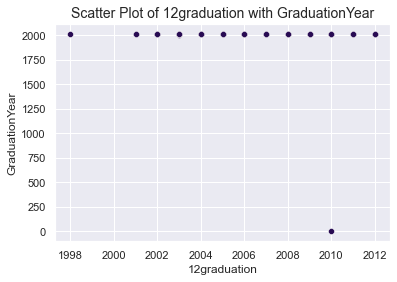

In [20]:
plot = scatterplot(x=df['12graduation'], y=df['GraduationYear'])
plot.set_title("Scatter Plot of 12graduation with GraduationYear", fontsize=14)

There is a point with 0 graduation year

This can be a error in dataset
Let's remove it

In [21]:
df = df[df["GraduationYear"]> 1750]

In [22]:
df["GraduationYear"].corr(df["12graduation"])

0.7944714215985573

There is high correlation between 10 & 12 percentages

Also there is high multicollinearity as seen in the VIF values

So again instead of using both, I will use only GraduationYear

In [23]:
df.drop(columns=["12graduation"], inplace=True)

Text(0.5, 1.0, 'Scatter Plot of 12percentage with collegeGPA')

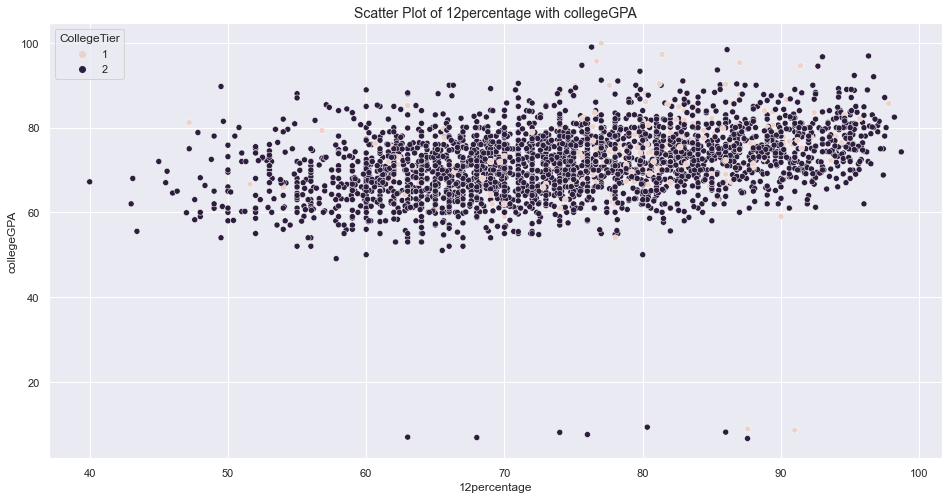

In [24]:
figure(figsize=(16,8))
plot = scatterplot(x=df['12percentage'], y=df['collegeGPA'], hue=df.CollegeTier)
plot.set_title("Scatter Plot of 12percentage with collegeGPA", fontsize=14)

Text(0.5, 1.0, 'Scatter Plot of collegeGPA with Salary')

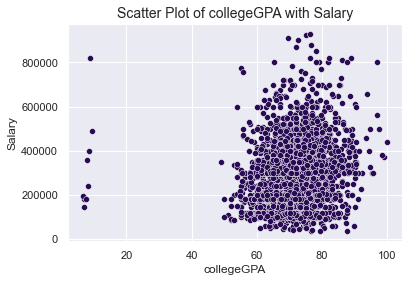

In [25]:
plot = scatterplot(x=df["collegeGPA"],y=df["Salary"])
plot.set_title("Scatter Plot of collegeGPA with Salary", fontsize=14)

I will manually remove the outleirs as they are easily identifiable in the plot

In [26]:
df = df[df["collegeGPA"] > 40]

Text(0.5, 1.0, 'Quant')

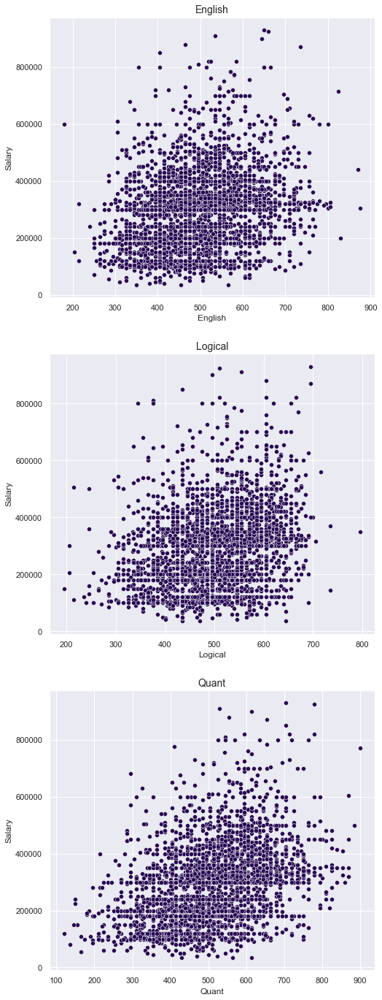

In [27]:
figure(figsize=(8,24))
subplot2grid((3,1),(0,0))
scatterplot(x=df['English'], y=df['Salary']).set_title("English", fontsize=14)
subplot2grid((3,1),(1,0))
scatterplot(x=df['Logical'], y=df['Salary']).set_title("Logical", fontsize=14)
subplot2grid((3,1),(2,0))
scatterplot(x=df['Quant'], y=df['Salary']).set_title("Quant", fontsize=14)

Text(0.5, 1.0, 'Domain')

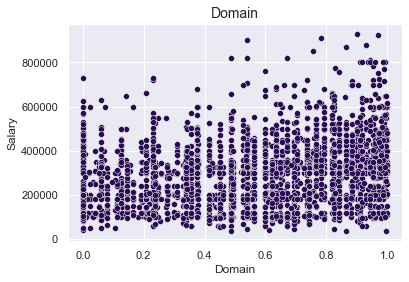

In [28]:
plot = scatterplot(x=df['Domain'], y=df['Salary'])
plot.set_title("Domain", fontsize=14)

Text(0.5, 1.0, 'CivilEngg')

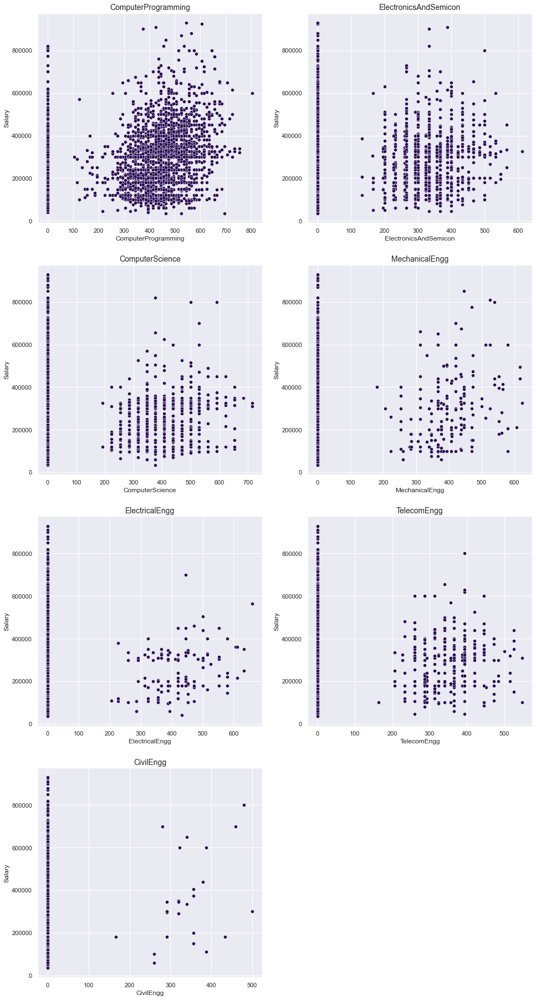

In [29]:
figure(figsize=(16,32))
subplot2grid((4,2),(0,0))
scatterplot(x=df['ComputerProgramming'], y=df['Salary']).set_title("ComputerProgramming", fontsize=14)
subplot2grid((4,2),(0,1))
scatterplot(x=df['ElectronicsAndSemicon'], y=df['Salary']).set_title("ElectronicsAndSemicon", fontsize=14)
subplot2grid((4,2),(1,0))
scatterplot(x=df['ComputerScience'], y=df['Salary']).set_title("ComputerScience", fontsize=14)
subplot2grid((4,2),(1,1))
scatterplot(x=df['MechanicalEngg'], y=df['Salary']).set_title("MechanicalEngg", fontsize=14)
subplot2grid((4,2),(2,0))
scatterplot(x=df['ElectricalEngg'], y=df['Salary']).set_title("ElectricalEngg", fontsize=14)
subplot2grid((4,2),(2,1))
scatterplot(x=df['TelecomEngg'], y=df['Salary']).set_title("TelecomEngg", fontsize=14)
subplot2grid((4,2),(3,0))
scatterplot(x=df['CivilEngg'], y=df['Salary']).set_title("CivilEngg", fontsize=14)

Text(0.5, 1.0, 'Scatter Plot of 10board with 12board')

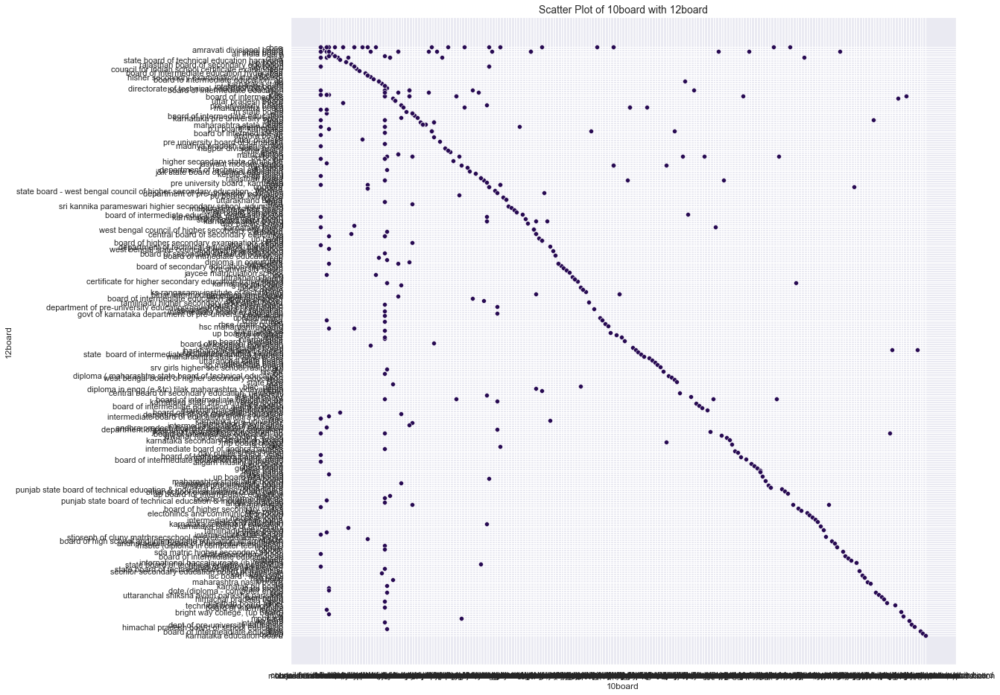

In [30]:
figure(figsize=(16,16))
plot= scatterplot(x=df["10board"],y=df["12board"])
plot.set_title("Scatter Plot of 10board with 12board", fontsize=14)

Though 10board and 12board are not very same but still I will remove 10board so that there is no risk of multicollinearity

In [31]:
df.drop(columns=["10board"], inplace=True)

Text(0.5, 1.0, 'Count Plot of 12board')

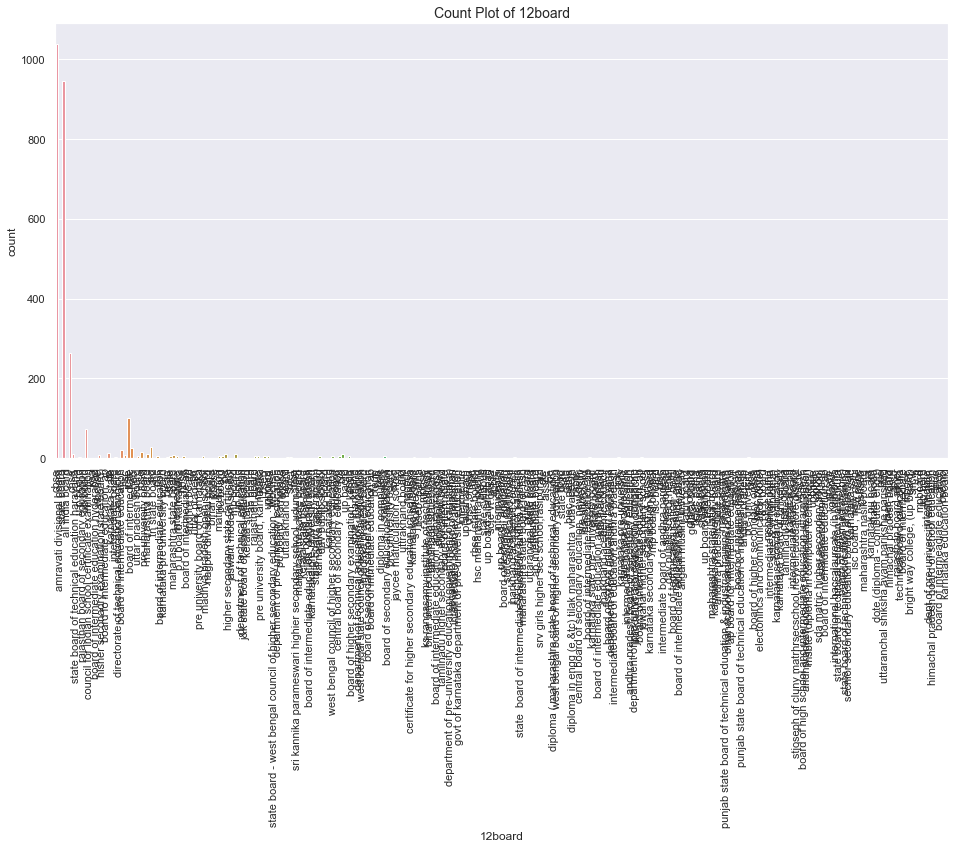

In [32]:
figure(figsize=(16,8))
plot = countplot(x=df["12board"])
plot.set_xticklabels(plot.get_xticklabels(),rotation="vertical")
plot.set_title("Count Plot of 12board", fontsize=14)

In [33]:
board = df["12board"].value_counts()

There are many boards which are very rarely choosen by students

So I will take major boards and categorize rest of them as other

In [34]:
rare_board = board[board <= 10]

In [35]:
def remove_rare_board(value):
    if value in rare_board:
        return 'other'
    else:
        return value
df["12board"] = df["12board"].apply(remove_rare_board)
df["12board"].value_counts()

cbse                               1037
state board                         945
other                               440
0                                   263
icse                                101
up board                             73
isc                                  29
board of intermediate                27
board of intermediate education      21
rbse                                 16
up                                   14
chse                                 11
mp board                             11
Name: 12board, dtype: int64

Looks like there is another error as there is no '0' board
I will replace this '0' board with 'cbse' as it is the most common one

In [36]:
df["12board"].replace(to_replace='0',value='cbse', inplace=True)

I will convert categorical data to numeric data using get_dummies, so we can use these in our model

In [37]:
df = get_dummies(df, columns=["12board"], prefix="board_")

Text(0.5, 1.0, 'Bar Plot of Degree with Salary')

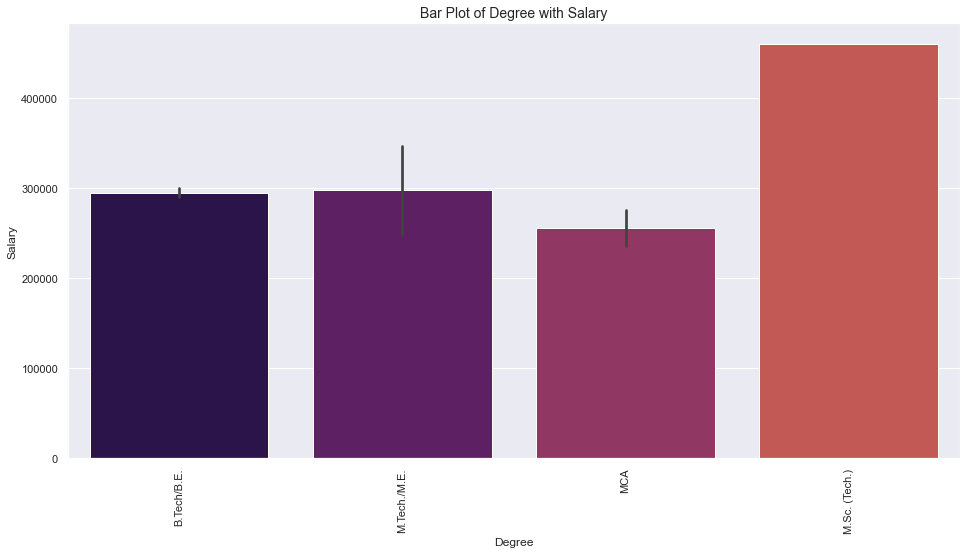

In [38]:
figure(figsize=(16,8))
plot = barplot(x=df["Degree"],y=df["Salary"])
plot.set_xticklabels(plot.get_xticklabels(),rotation="vertical")
plot.set_title("Bar Plot of Degree with Salary", fontsize=14)

In [39]:
df["Degree"].value_counts()

B.Tech/B.E.      2749
MCA               200
M.Tech./M.E.       38
M.Sc. (Tech.)       1
Name: Degree, dtype: int64

Looks like majority of students belong to B.Tech./B.E. but still degree is very important factor in determining Salary

Again I will convert categorical data to numeric data using get_dummies, so we can use these in our model

In [40]:
df = get_dummies(df, columns=["Degree"], prefix="degree_")

Text(0.5, 1.0, 'Count Plot of Specialization')

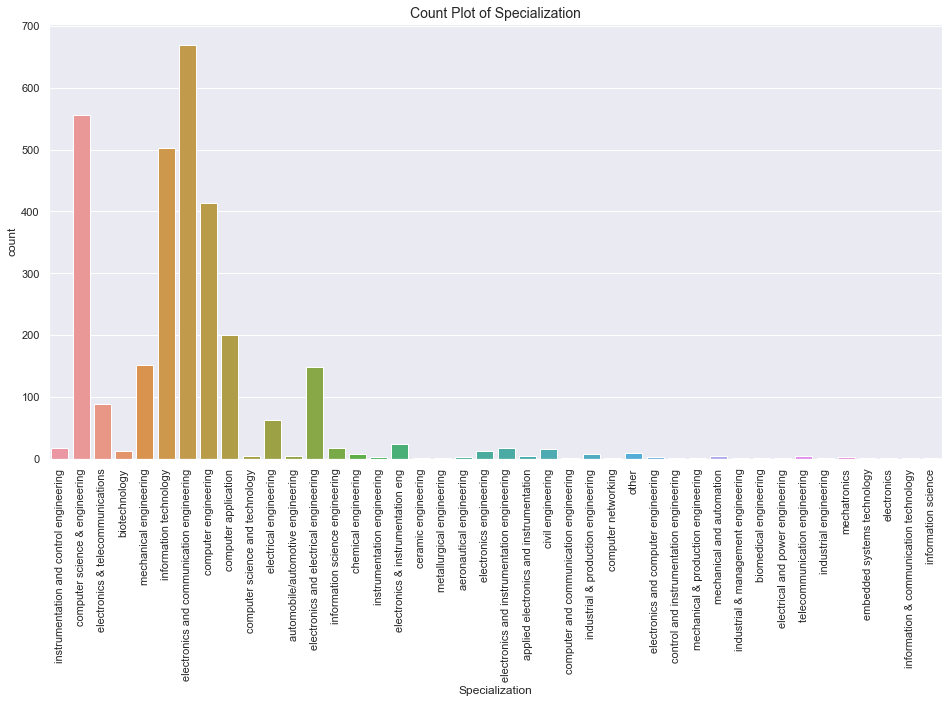

In [41]:
figure(figsize=(16,8))
plot = countplot(x=df["Specialization"])
plot.set_xticklabels(plot.get_xticklabels(),rotation="vertical")
plot.set_title("Count Plot of Specialization", fontsize=14)

In [42]:
specializations = df["Specialization"].value_counts()

I will categorize rarely chosen specializations into other

In [43]:
rare_specialization = specializations[specializations <= 10]

In [44]:
def remove_rare_specializations(value):
    if value in rare_specialization:
        return 'other'
    else:
        return value
df["Specialization"] = df["Specialization"].apply(remove_rare_specializations)
df["Specialization"].value_counts()

electronics and communication engineering      670
computer science & engineering                 556
information technology                         503
computer engineering                           414
computer application                           201
mechanical engineering                         151
electronics and electrical engineering         148
electronics & telecommunications                89
other                                           76
electrical engineering                          63
electronics & instrumentation eng               24
electronics and instrumentation engineering     18
instrumentation and control engineering         18
information science engineering                 18
civil engineering                               15
electronics engineering                         12
biotechnology                                   12
Name: Specialization, dtype: int64

Now let's convert it to numeric so we can use it in our model

In [45]:
df = get_dummies(df, columns=["Specialization"], prefix="specialization_")

Text(0.5, 1.0, 'openess_to_experience')

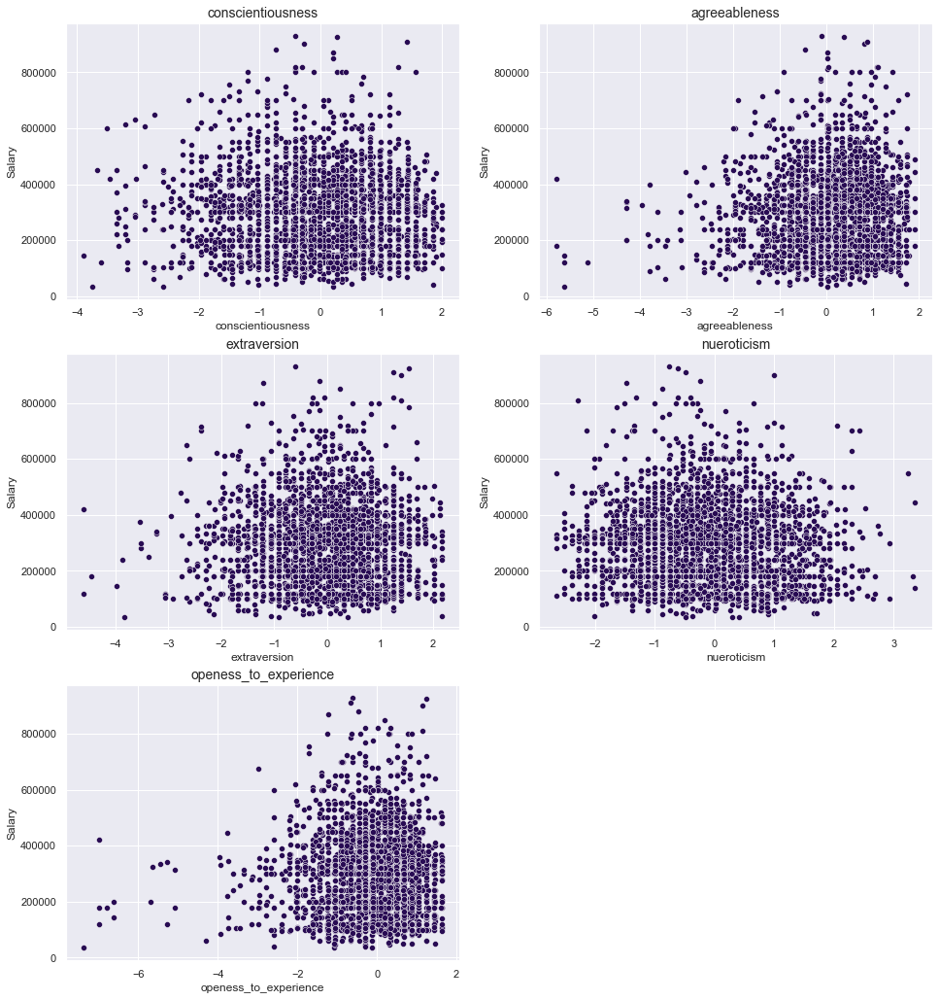

In [46]:
figure(figsize=(16,24))
subplot2grid((4,2),(0,0))
scatterplot(x=df['conscientiousness'], y=df['Salary']).set_title("conscientiousness", fontsize=14)
subplot2grid((4,2),(0,1))
scatterplot(x=df['agreeableness'], y=df['Salary']).set_title("agreeableness", fontsize=14)
subplot2grid((4,2),(1,0))
scatterplot(x=df['extraversion'], y=df['Salary']).set_title("extraversion", fontsize=14)
subplot2grid((4,2),(1,1))
scatterplot(x=df['nueroticism'], y=df['Salary']).set_title("nueroticism", fontsize=14)
subplot2grid((4,2),(2,0))
scatterplot(x=df['openess_to_experience'], y=df['Salary']).set_title("openess_to_experience", fontsize=14)

Text(0.5, 1.0, 'Scatter Plot of CollegeTier with CollegeCityTier')

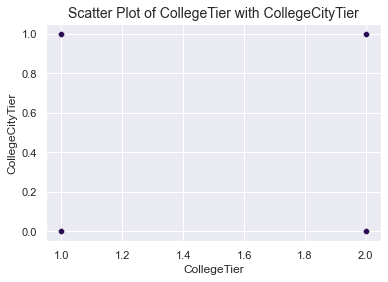

In [47]:
plot = scatterplot(x=df["CollegeTier"], y=df["CollegeCityTier"])
plot.set_title("Scatter Plot of CollegeTier with CollegeCityTier", fontsize=14)

Let's remove CollegeCityTier as it is not as relevant as CollegeTier

In [48]:
df.drop(columns=["CollegeCityTier"], inplace=True)

Text(0.5, 1.0, 'Count Plot of CollegeState')

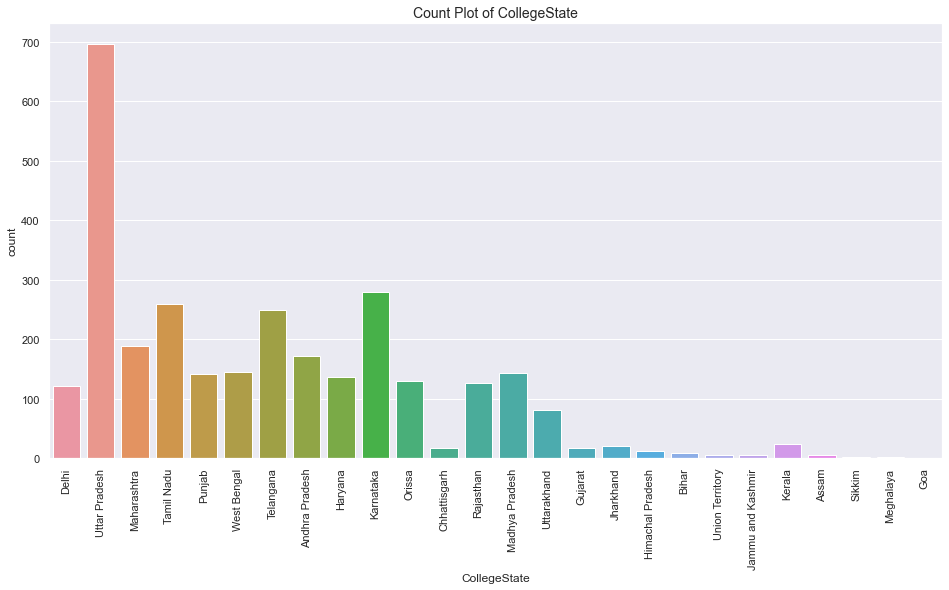

In [49]:
figure(figsize=(16,8))
plot = countplot(x=df["CollegeState"])
plot.set_xticklabels(plot.get_xticklabels(),rotation="vertical")
plot.set_title("Count Plot of CollegeState", fontsize=14)

In [50]:
df["CollegeState"].value_counts()

Uttar Pradesh        696
Karnataka            279
Tamil Nadu           260
Telangana            249
Maharashtra          188
Andhra Pradesh       172
West Bengal          145
Madhya Pradesh       143
Punjab               141
Haryana              136
Orissa               130
Rajasthan            126
Delhi                122
Uttarakhand           81
Kerala                24
Jharkhand             20
Gujarat               18
Chhattisgarh          17
Himachal Pradesh      13
Bihar                  8
Union Territory        5
Jammu and Kashmir      5
Assam                  5
Sikkim                 2
Meghalaya              2
Goa                    1
Name: CollegeState, dtype: int64

In [51]:
df = get_dummies(df, columns=["CollegeState"], prefix="state_")

In [52]:
df.columns

Index(['Gender', '12percentage', 'CollegeTier', 'collegeGPA', 'CollegeCityID',
       'GraduationYear', 'English', 'Logical', 'Quant', 'Domain',
       'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience',
       'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg',
       'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience', 'Salary', 'board__board of intermediate',
       'board__board of intermediate education', 'board__cbse', 'board__chse',
       'board__icse', 'board__isc', 'board__mp board', 'board__other',
       'board__rbse', 'board__state board', 'board__up', 'board__up board',
       'degree__B.Tech/B.E.', 'degree__M.Sc. (Tech.)', 'degree__M.Tech./M.E.',
       'degree__MCA', 'specialization__biotechnology',
       'specialization__civil engineering',
       'specialization__computer application',
       'specialization__computer engineering',
       'specialization__computer science & engineering',
     

I will use Ridge Regression as there is some multicollinearity

Ridge provides advantage in this case

In [53]:
data = df.copy()
X = data.drop(columns=["Salary"])
y = data[["Salary"]]
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.4,random_state=49, shuffle=True)

model = Ridge(alpha=0.5)
model.fit(X_train,y_train)

y_pred = model.predict(X_test)

print(sqrt(mean_squared_error(y_test,y_pred)))
print(r2_score(y_test,y_pred))

118460.60347482258
0.28575531046503355
